# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


### Импорт библиотек

In [2]:
# Базовые библиотеки
import math
import numpy as np
import pandas as pd
import torch
import transformers
import os
from os import listdir
from os.path import isfile, join

# Нейросеть
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras import Model

# Обучение моделей
from catboost import CatBoostRegressor
from tqdm import notebook
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler

# Графика
from PIL import Image # Просмотр изображений
import matplotlib.pyplot as plt

2024-04-12 12:33:03.494930: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-12 12:33:03.495031: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-12 12:33:03.640721: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
     tf.config.experimental.set_memory_growth(gpus[0], True)

### Анализ датасетов

In [4]:
DATA_PATH = '/kaggle/input/image-search/datasets'

train_dataset = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
crowd_annotations = pd.read_csv(
    os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), 
    sep='\t', 
    names=['image', 'query_id', 'match_rate', 'match_count', 'mismatch_count']
)
expert_annotations = pd.read_csv(
    os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), 
    sep='\t', 
    names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3']
)
test_queries = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), sep='|', index_col=[0])
test_images = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'), sep='|')


In [5]:
def describe_dataframe(dataframe):
    display(dataframe.head(10))
    display(dataframe.info())
    display(dataframe.describe(percentiles=[.5]).T)
    print(f"Количество дублированных строк: {dataframe.duplicated().sum()}")

In [6]:
describe_dataframe(train_dataset)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None

,count,unique,top,freq
image,5822,1000,3107513635_fe8a21f148.jpg,10
query_id,5822,977,2600867924_cd502fc911.jpg#2,34
query_text,5822,977,"Two dogs , one brown and white and one black a...",34


Количество дублированных строк: 0


In [7]:
describe_dataframe(crowd_annotations)

,image,query_id,match_rate,match_count,mismatch_count
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           47830 non-null  object 
 1   query_id        47830 non-null  object 
 2   match_rate      47830 non-null  float64
 3   match_count     47830 non-null  int64  
 4   mismatch_count  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None

,count,mean,std,min,50%,max
match_rate,47830.0,0.068786,0.207532,0.0,0.0,1.0
match_count,47830.0,0.208488,0.628898,0.0,0.0,5.0
mismatch_count,47830.0,2.820155,0.656676,0.0,3.0,6.0


Количество дублированных строк: 0


In [8]:
describe_dataframe(expert_annotations)

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


None

,count,mean,std,min,50%,max
expert_1,5822.0,1.436620,0.787084,1.0,1.0,4.0
expert_2,5822.0,1.624356,0.856222,1.0,1.0,4.0
expert_3,5822.0,1.881999,0.904087,1.0,2.0,4.0


Количество дублированных строк: 0


In [9]:
describe_dataframe(test_queries)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adul...,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a ...,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera...,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green...,1232148178_4f45cc3284.jpg


<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


None

,count,unique,top,freq
query_id,500,500,989851184_9ef368e520.jpg#4,1
query_text,500,500,The black dog has a toy in its mouth and a per...,1
image,500,100,989851184_9ef368e520.jpg,5


Количество дублированных строк: 0


In [10]:
describe_dataframe(test_images)

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg
5,424307754_1e2f44d265.jpg
6,3044359043_627488ddf0.jpg
7,3396275223_ee080df8b5.jpg
8,2977379863_2e8d7a104e.jpg
9,634891010_9fa189effb.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


None

,count,unique,top,freq
image,100,100,2346402952_e47d0065b6.jpg,1


Количество дублированных строк: 0


Вывод по анализу датасетов:
Датасеты не имеют пропусков или дублированных строк.

Для трейна при этом есть как экспертные оценки соответствия 5822 шт. так и оценки выполненные на краудфайдинговой платформе обычными людьми - 47830 шт, они частично совпадают.

Пересечений между наборами данных для трейна и теста не обнаружено.

### Анализ изображений

In [11]:
path = os.path.join(DATA_PATH, 'train_images1/')

onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]

# Анализ информации о первом изображении тренировочного датасета
shapes = [np.array(Image.open(f'{path}{f}')).shape for f in onlyfiles]

In [12]:
print('Максимальная X размерность:', max(shapes, key=lambda x: x[0]))
print('Максимальная Y размерность:', max(shapes, key=lambda x: x[1]))
print('Минимальная X размерность:', min(shapes, key=lambda x: x[0]))
print('Минимальная Y размерность:', min(shapes, key=lambda x: x[1]))
print('Количество слоев:', sum(map(lambda x: x[2], shapes)) / len(shapes))
print('Длинна датасета:', len(shapes))

Максимальная X размерность: (500, 375, 3)
Максимальная Y размерность: (357, 500, 3)
Минимальная X размерность: (166, 500, 3)
Минимальная Y размерность: (500, 200, 3)
Количество слоев: 3.0
Длинна датасета: 1000


Файл       : 280706862_14c30d734a.jpg
Размерность: (357, 500, 3)


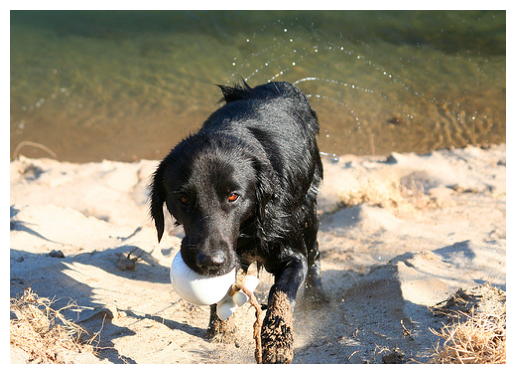

Файл       : 929679367_ff8c7df2ee.jpg
Размерность: (500, 375, 3)


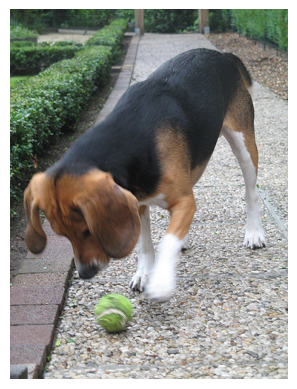

Файл       : 1317292658_ba29330a0b.jpg
Размерность: (500, 334, 3)


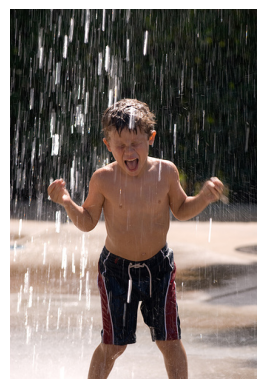

Файл       : 3411393875_a9ff73c67a.jpg
Размерность: (500, 413, 3)


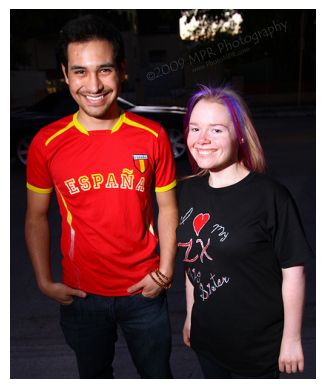

Файл       : 3619416477_9d18580a14.jpg
Размерность: (500, 351, 3)


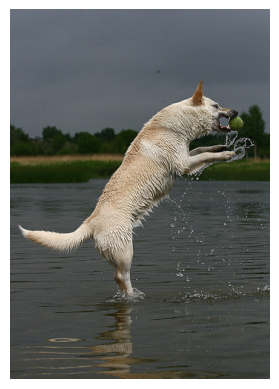

Файл       : 506738508_327efdf9c3.jpg
Размерность: (500, 375, 3)


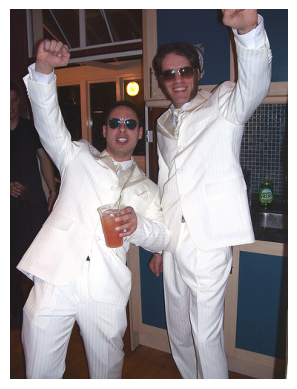

Файл       : 747921928_48eb02aab2.jpg
Размерность: (500, 390, 3)


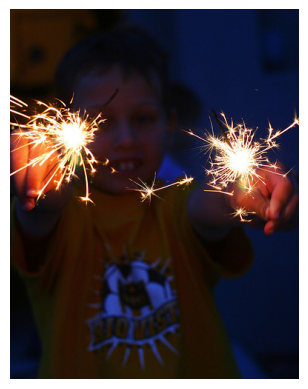

Файл       : 2607462776_78e639d891.jpg
Размерность: (375, 500, 3)


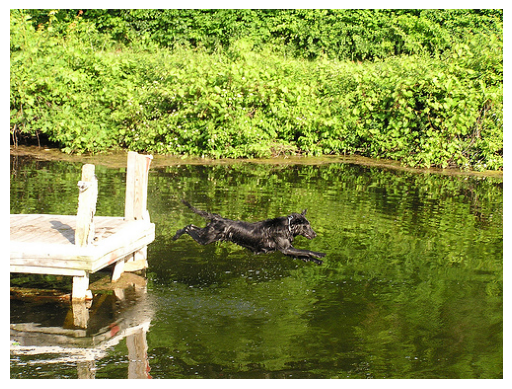

Файл       : 757332692_6866ae545c.jpg
Размерность: (334, 500, 3)


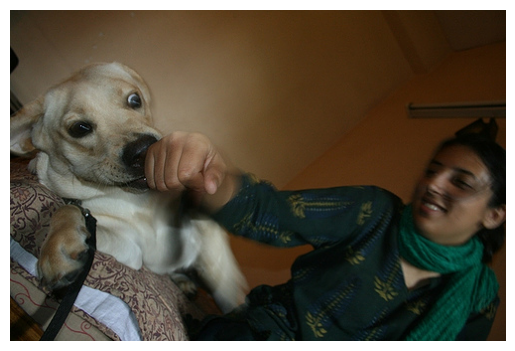

Файл       : 486917990_72bd4069af.jpg
Размерность: (500, 318, 3)


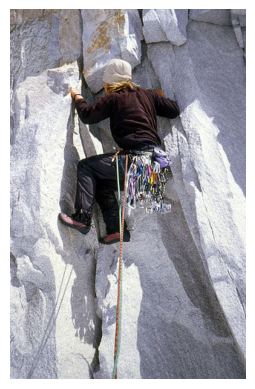

In [13]:
for i, file in enumerate(onlyfiles):
    if i == 10:
        break
    print('Файл       :', file)
    image = Image.open(path + file)
    array = np.array(image)
    print('Размерность:', array.shape)
    plt.imshow(array, cmap='gray')
    plt.axis('off')
    plt.show()

Выводы по анализу изображений:
В нашем распоряжении 1000 картинок на трейн и 100 на тест. Есть предобработанные файлы с сочетаниями описаний и картинок, для трейна и теста.

На трейне использованы только описания картинок под номером #2, в тесте же к каждой картинке даны по 5 описаний.

Размерность изображений: 
- Максимальная X размерность: (500, 375, 3)
- Максимальная Y размерность: (357, 500, 3)
- Минимальная X размерность: (166, 500, 3)
- Минимальная Y размерность: (500, 200, 3)
- Количество слоев: 3.0

### Обработка тренировочного датасета

In [14]:
def super_round(val):
    if (float(val) % 1) >= 0.5:
        x = math.ceil(val)
    else:
        x = round(val)
    return x

def handle_match_rate(row):
    expert_1 = row[3] - 1
    expert_2 = row[4] - 1
    expert_3 = row[5] - 1
    expert_match_rate = (expert_1 + expert_2 + expert_3) / 9
    common_match_rate = row[6]

    if str(common_match_rate) != 'nan':
        return expert_match_rate * 0.75 +  common_match_rate * 0.25 # super_round(expert_match_rate * 0.75 +  common_match_rate * 0.25)
    else:
        return expert_match_rate # super_round(expert_match_rate)

In [15]:
train = pd.merge(train_dataset, expert_annotations, on=['query_id', 'image'])
train = pd.merge(train, crowd_annotations, on=['query_id', 'image'], how='left')

In [16]:
train['match'] = train.apply(handle_match_rate, axis=1)

/tmp/ipykernel_24/1924911188.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expert_1 = row[3] - 1
/tmp/ipykernel_24/1924911188.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expert_2 = row[4] - 1
/tmp/ipykernel_24/1924911188.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expert_3 = row[5] - 1
/tmp/ipykernel_24/1924911188.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future v

In [17]:
train.drop(columns=['expert_2', 'expert_1', 'expert_3', 'match_count', 'mismatch_count', 'match_rate'], inplace=True)

In [18]:
describe_dataframe(train)

,image,query_id,query_text,match
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.166667
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   match       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


None

,count,mean,std,min,50%,max
match,5822.0,0.195419,0.253397,0.0,0.111111,1.0


Количество дублированных строк: 0


## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [19]:
stop_words = [
    'child',
    'children',
    'baby',
    'babies',
    'boy',
    'boys',
    'girl',
    'girls',
    'kid',
    'kids',
    'infant',
    'infants',
    'toddler',
    'toddlers',
    'teenager',
    'teenagers',
    'schoolboy',
    'schoolgirl',
    'pupil',
    'pupils',
    'youngster',
    'youngsters'
]
def contains_stop_word(query):
    return any(stop_word in query.lower() for stop_word in stop_words)

def contains_bad_image(image, bad_images):
    return image in bad_images

In [20]:
# train = train[~train['query_text'].apply(contains_stop_word)]

In [21]:
bad_images = train[train['query_text'].apply(contains_stop_word)]['query_id'].apply(lambda x: x[: -2]).unique()
f"Количество фотографий к удалению: {len(bad_images)}. Пример - {bad_images[0]}"

'Количество фотографий к удалению: 294. Пример - 2549968784_39bfbe44f9.jpg'

In [22]:
train = train[~train['image'].apply(contains_bad_image, args=(bad_images,))]

In [23]:
describe_dataframe(train)

,image,query_id,query_text,match
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
11,486712504_36be449055.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
12,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.083333
13,1167669558_87a8a467d6.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.333333


<class 'pandas.core.frame.DataFrame'>
Index: 4066 entries, 0 to 5820
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4066 non-null   object 
 1   query_id    4066 non-null   object 
 2   query_text  4066 non-null   object 
 3   match       4066 non-null   float64
dtypes: float64(1), object(3)
memory usage: 158.8+ KB


None

,count,mean,std,min,50%,max
match,4066.0,0.216224,0.267395,0.0,0.111111,1.0


Количество дублированных строк: 0


## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [24]:
shape = 224
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
def load_train():
    train_datagen_flow = datagen.flow_from_dataframe(
        dataframe=train,
        directory=os.path.join(DATA_PATH, 'train_images1/'),  # '/kaggle/input/image-search/datasets/train_images1/',
        x_col='image',  # Column in DataFrame containing the file paths
        y_col=None,  # Assuming you're only loading images for inference/vectorization
        target_size=(shape, shape),  # Size expected by ResNet50
        class_mode=None,  # Since we're not using labels
        batch_size=32,  # Adjust based on your memory capacity
        shuffle=False
    )
    return train_datagen_flow


def load_test():
    test_datagen_flow = datagen.flow_from_dataframe(
        dataframe=test_images,
        directory=os.path.join(DATA_PATH, 'test_images1/'),
        x_col='image',  # Column in DataFrame containing the file paths
        y_col=None,  # Assuming you're only loading images for inference/vectorization
        target_size=(shape, shape),  # Size expected by ResNet50
        class_mode=None,  # Since we're not using labels
        batch_size=32,  # Adjust based on your memory capacity
        shuffle=False
    )
    return test_datagen_flow

In [25]:
tr = load_train()
ts = load_test()

Found 4066 validated image filenames.
Found 100 validated image filenames.


In [26]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("TensorFlow will automatically use the GPU when available.")

Num GPUs Available:  1
TensorFlow will automatically use the GPU when available.


In [27]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(shape, shape, 3))

image_vectorize_model = Model(inputs=base_model.input, outputs=GlobalAveragePooling2D()(base_model.output))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [28]:
vectorized_images = image_vectorize_model.predict(tr, verbose=1)

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  3/128 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step 

I0000 00:00:1712925233.063886      71 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


128/128 ━━━━━━━━━━━━━━━━━━━━ 31s 180ms/step


In [29]:
vectorized_images.shape

(4066, 2048)

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [30]:
model_name = 'distilbert/distilbert-base-uncased'
text_vectorize_model = transformers.AutoModel.from_pretrained(model_name)
tokenizer = transformers.AutoTokenizer.from_pretrained(model_name)

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [31]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
text_vectorize_model = text_vectorize_model.to(device)

In [32]:
def tokens_to_vectors(tokens):
    max_len = max(len(i) for i in tokens) # 512

    padded = np.array([i + [0]*(max_len - len(i)) for i in tokens if len(i) <= max_len])

    attention_mask = np.where(padded != 0, 1, 0)
    
    batch_size = 100
    embeddings = []
    for i in notebook.tqdm(range(math.ceil(padded.shape[0] / batch_size))):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])

        with torch.no_grad():
            batch_embeddings = text_vectorize_model(batch.to(device), attention_mask=attention_mask_batch.to(device))

        embeddings.append(batch_embeddings[0][:,0,:].cpu().numpy())
    return embeddings

In [33]:
tokenized = train['query_text'].apply(lambda x: tokenizer.encode(x, add_special_tokens=True))
display(tokenized, tokenized.shape)

0       [101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...
1       [101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...
4       [101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...
6       [101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...
7       [101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...
                              ...                        
5810    [101, 1037, 2158, 4832, 2012, 1996, 4211, 1997...
5811    [101, 2048, 2273, 1999, 2304, 17764, 2369, 103...
5813    [101, 2028, 2711, 2003, 2006, 1037, 8301, 6336...
5819    [101, 1037, 3899, 4832, 2006, 1996, 2217, 1997...
5820    [101, 1037, 14819, 2854, 6302, 1997, 2048, 607...
Name: query_text, Length: 4066, dtype: object

(4066,)

In [34]:
embeddings = np.concatenate(tokens_to_vectors(tokenized))
embeddings.shape

  0%|          | 0/41 [00:00<?, ?it/s]

(4066, 768)

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [35]:
concatenated_vectors = np.concatenate([vectorized_images, embeddings], axis=1)


In [36]:
concatenated_vectors_df = pd.concat([train, pd.DataFrame(concatenated_vectors, index=train.index)], axis=1)
concatenated_vectors_df.head()

,image,query_id,query_text,match,0,1,2,3,4,5,...,2806,2807,2808,2809,2810,2811,2812,2813,2814,2815
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.086566,0.001165,0.000000,2.469638,0.017138,0.000000,...,-0.267759,-0.31003,-0.024312,0.06028,-0.067874,0.414335,0.083891,-0.048825,0.401808,0.235846
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.302040,0.391928,0.264564,0.138015,0.127347,0.899848,...,-0.267759,-0.31003,-0.024312,0.06028,-0.067874,0.414335,0.083891,-0.048825,0.401808,0.235846
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.786644,0.148073,0.000000,0.583758,0.306661,0.068652,...,-0.267759,-0.31003,-0.024312,0.06028,-0.067874,0.414335,0.083891,-0.048825,0.401808,0.235846
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.082659,1.591914,0.145800,2.611780,0.000000,0.090302,...,-0.267759,-0.31003,-0.024312,0.06028,-0.067874,0.414335,0.083891,-0.048825,0.401808,0.235846
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.054533,1.022339,0.005564,0.502956,0.000000,0.236696,...,-0.267759,-0.31003,-0.024312,0.06028,-0.067874,0.414335,0.083891,-0.048825,0.401808,0.235846


In [37]:
concatenated_vectors_df.reset_index(inplace=True, drop=True)

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

Я считаю, что необходимо и достаточно выбрать метрику качества моделей MSE (Mean Squared Error).
Аргументы в пользу применения метрики Mean Squared Error (MSE):
- Акцентирование внимания на больших ошибках: MSE особенно чувствительна к большим ошибкам, что делает её подходящей для задач, где даже небольшие отклонения могут иметь серьёзные последствия.
- Возможность сравнения моделей: MSE позволяет сравнивать модели на основе их способности минимизировать общую квадратичную ошибку, что делает её полезной для выбора лучшей модели среди нескольких вариантов.
- Соответствие статистическим методам: MSE широко используется в статистике и эконометрике, что делает её знакомой и понятной для исследователей.
- Эффективность в задачах с непрерывными данными: MSE хорошо подходит для задач, где целевые переменные являются непрерывными, что характерно для многих задач машинного обучения.
- Возможность оптимизации: MSE может быть использована в качестве функции потерь в алгоритмах машинного обучения, что позволяет напрямую оптимизировать модель для минимизации квадратичной ошибки.
- Фокус на дисперсии: MSE акцентирует внимание на дисперсии ошибок, что важно в задачах, где требуется высокая точность предсказаний.
- Применимость к различным масштабам данных: MSE может быть адаптирована к различным масштабам данных путём нормализации или стандартизации входных данных.
- Использование в качестве критерия остановки обучения: В некоторых алгоритмах машинного обучения MSE может использоваться как критерий остановки обучения, когда достигается минимальное значение ошибки.
- Широкая применимость: MSE применяется в различных областях машинного обучения, таких как регрессия, классификация и кластеризация, что делает её универсальной метрикой.
- Возможность анализа влияния отдельных наблюдений: MSE позволяет анализировать влияние отдельных наблюдений на общую ошибку, что может быть полезно для понимания работы модели.

In [38]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, validation_indices = next(
    gss.split(
        X=concatenated_vectors_df.drop(columns=['match', 'query_id', 'query_text']), 
        y=concatenated_vectors_df['match'], 
        groups=concatenated_vectors_df['image']
    )
)
train_df, validation_df = concatenated_vectors_df.loc[train_indices], concatenated_vectors_df.loc[validation_indices]

In [39]:
X_train = train_df.drop(columns=['match', 'query_id', 'query_text', 'image'])
y_train = train_df['match']
X_valid = validation_df.drop(columns=['match', 'query_id', 'query_text', 'image'])
y_valid = validation_df['match']

In [40]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_valid = scaler.transform(X_valid)

In [41]:
describe_dataframe(validation_df)

,image,query_id,query_text,match,0,1,2,3,4,5,...,2806,2807,2808,2809,2810,2811,2812,2813,2814,2815
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,0.786644,0.148073,0.000000,0.583758,0.306661,0.068652,...,-0.267759,-0.310030,-0.024312,0.060280,-0.067874,0.414335,0.083891,-0.048825,0.401808,0.235846
5,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,0.251756,0.717652,0.068342,0.531776,0.269693,2.691145,...,-0.267759,-0.310030,-0.024312,0.060280,-0.067874,0.414335,0.083891,-0.048825,0.401808,0.235846
12,3506560025_8d0f4f9ac4.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.333333,0.023103,0.315420,0.180339,0.767090,0.033953,1.210802,...,-0.115461,-0.248783,0.217875,0.032912,0.104052,0.134409,-0.130084,-0.257901,0.360228,0.127657
21,370713359_7560808550.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.000000,0.184948,0.153553,0.070009,2.718204,0.002083,0.131772,...,-0.101414,-0.083590,0.138591,0.067902,0.183706,0.040504,-0.009349,-0.021518,0.230867,0.212783
25,2225231022_1632d0a5aa.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.000000,0.519528,0.422563,0.019421,2.959132,0.043679,0.252829,...,0.148746,-0.282070,0.067357,-0.011631,0.181188,-0.398580,-0.238885,-0.154388,0.421740,0.129615
31,2351479551_e8820a1ff3.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man weari...,0.083333,0.098021,0.008783,0.038295,0.368198,0.039773,0.201422,...,0.030514,-0.348585,0.300627,-0.013796,0.162392,0.053031,-0.146348,-0.062388,0.356317,0.274619
32,3256043809_47258e0b3e.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man weari...,0.000000,0.478788,1.321293,0.053821,0.164656,0.651463,0.484571,...,0.030514,-0.348585,0.300627,-0.013796,0.162392,0.053031,-0.146348,-0.062388,0.356317,0.274619
38,3185371756_ff4e9fa8a6.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,0.000000,0.354915,0.517089,0.021633,0.124378,0.334273,0.014514,...,-0.258168,-0.156408,0.088670,0.181973,0.012399,0.043173,-0.157214,0.115866,0.452243,0.376857
40,3425835357_204e620a66.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,0.111111,0.290786,0.754442,0.018763,1.081189,0.083402,0.227465,...,-0.258168,-0.156408,0.088670,0.181973,0.012399,0.043173,-0.157214,0.115866,0.452243,0.376857
41,343218198_1ca90e0734.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,0.111111,0.251756,0.717652,0.068342,0.531776,0.269693,2.691145,...,-0.258168,-0.156408,0.088670,0.181973,0.012399,0.043173,-0.157214,0.115866,0.452243,0.376857


<class 'pandas.core.frame.DataFrame'>
Index: 1238 entries, 2 to 4064
Columns: 2820 entries, image to 2815
dtypes: float32(2816), float64(1), object(3)
memory usage: 13.3+ MB


None

,count,mean,std,min,50%,max
match,1238.0,0.213716,0.262250,0.000000,0.111111,1.000000
0,1238.0,0.433735,0.497274,0.000000,0.287422,3.725430
1,1238.0,0.835735,0.889236,0.000000,0.588665,6.682830
2,1238.0,0.295633,0.380572,0.000000,0.143254,2.186953
3,1238.0,0.638503,0.924011,0.000000,0.216231,4.686243
...,...,...,...,...,...,...
2811,1238.0,0.130850,0.148229,-0.398580,0.122542,0.610841
2812,1238.0,-0.090686,0.113607,-0.434928,-0.092270,0.285916
2813,1238.0,-0.143996,0.103375,-0.539550,-0.135562,0.181834
2814,1238.0,0.399260,0.128564,-0.011217,0.395140,0.802814


Количество дублированных строк: 0


### Базовая модель для оценки адекватности предсказаний

In [42]:
print(f"Результат первой модели нейронной сети {mean_squared_error(np.zeros(len(X_valid)), y_valid)}")

Результат первой модели нейронной сети 0.11439424026207144


### Модель логистической регрессии

In [43]:
lr = Lasso()
lr.fit(X_train, y_train)
predictions = lr.predict(X_valid)
print(f"Результат модели логистической регрессии {mean_squared_error(predictions, y_valid)}")

Результат модели логистической регрессии 0.06873265814376733


Страшные цифры!

### Модель регрессии Catboost

In [44]:
RANDOM_STATE = 12321
params = {
    'loss_function': 'RMSE',  # objective function Logloss
    'eval_metric': 'RMSE',  # metric
    'verbose': 200,  # output to stdout info about training process every 200 iterations
    'random_seed': RANDOM_STATE,
    'task_type': 'GPU'
}
cbc_1 = CatBoostRegressor(**params)
cbc_1.fit(
    X_train, y_train,
    # data to train on (required parameters, unless we provide X as a pool object, will be shown below)
    eval_set=(X_valid, y_valid),  # data to validate on
    use_best_model=True,  # True if we don't want to save trees created after iteration with the best validation score
    plot=True
    # True for visualization of the training process (it is not shown in a published kernel - try executing this code)
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.069482
0:	learn: 0.2674583	test: 0.2606411	best: 0.2606411 (0)	total: 13.4s	remaining: 3h 42m 36s
200:	learn: 0.1613445	test: 0.2316868	best: 0.2316868 (200)	total: 30.6s	remaining: 2m 1s
400:	learn: 0.1251075	test: 0.2286048	best: 0.2286048 (400)	total: 47.4s	remaining: 1m 10s
600:	learn: 0.1066207	test: 0.2266038	best: 0.2265400 (592)	total: 1m 3s	remaining: 42.4s
800:	learn: 0.0946343	test: 0.2260337	best: 0.2260337 (800)	total: 1m 20s	remaining: 19.9s
999:	learn: 0.0873072	test: 0.2259243	best: 0.2256499 (924)	total: 1m 36s	remaining: 0us
bestTest = 0.2256499392
bestIteration = 924
Shrink model to first 925 iterations.


In [45]:
print(f"Результат модели CatBoost {mean_squared_error(cbc_1.predict(X_valid), y_valid)}")

Результат модели CatBoost 0.05091789261147757


### Модель полносвязной нейросети

In [46]:
first_nn_model = Sequential()
first_nn_model.add(Dense(100, activation='leaky_relu'))
first_nn_model.add(Dense(10, activation='leaky_relu'))
first_nn_model.add(Dense(1, activation='relu'))
optimizer = Adam(learning_rate=1e-3)
first_nn_model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mean_squared_error'])
first_nn_model.fit(
    X_train,
    y_train,
    validation_data=(X_valid, y_valid),
    steps_per_epoch=None,
    validation_steps=None,
    batch_size=32,
    epochs=5,
    verbose=1, shuffle=True)

Epoch 1/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.8143 - mean_squared_error: 0.8144 - val_loss: 0.1398 - val_mean_squared_error: 0.1403
Epoch 2/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1242 - mean_squared_error: 0.1242 - val_loss: 0.1411 - val_mean_squared_error: 0.1417
Epoch 3/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1170 - mean_squared_error: 0.1170 - val_loss: 0.1325 - val_mean_squared_error: 0.1330
Epoch 4/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1229 - mean_squared_error: 0.1229 - val_loss: 0.1178 - val_mean_squared_error: 0.1182
Epoch 5/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1129 - mean_squared_error: 0.1130 - val_loss: 0.1174 - val_mean_squared_error: 0.1177


In [47]:
print(f"Результат первой модели нейронной сети {mean_squared_error(first_nn_model.predict(X_valid), y_valid)}")

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Результат первой модели нейронной сети 0.11773115603736836


In [48]:
second_nn_model = Sequential()
second_nn_model.add(Dense(2820, activation='leaky_relu'))
second_nn_model.add(BatchNormalization())
second_nn_model.add(Dense(940, activation='leaky_relu'))
second_nn_model.add(BatchNormalization())
second_nn_model.add(Dense(300, activation='leaky_relu'))
second_nn_model.add(BatchNormalization())
second_nn_model.add(Dense(1, activation='relu'))
second_nn_model.compile(optimizer=Adam(learning_rate=1e-3), loss='mean_squared_error', metrics=['mean_squared_error'])
second_nn_model.fit(X_train, y_train, validation_data=(X_valid, y_valid), batch_size=32, epochs=500)

Epoch 1/500
89/89 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 1.8052 - mean_squared_error: 1.8053 - val_loss: 0.1160 - val_mean_squared_error: 0.1163
Epoch 2/500
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1099 - mean_squared_error: 0.1099 - val_loss: 0.1025 - val_mean_squared_error: 0.1030
Epoch 3/500
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1060 - mean_squared_error: 0.1060 - val_loss: 0.1007 - val_mean_squared_error: 0.1013
Epoch 4/500
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0951 - mean_squared_error: 0.0951 - val_loss: 0.1043 - val_mean_squared_error: 0.1045
Epoch 5/500
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0979 - mean_squared_error: 0.0979 - val_loss: 0.1051 - val_mean_squared_error: 0.1054
Epoch 6/500
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0996 - val_mean_squared_error: 0.0997
Epoch 7/500
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.0824 - v

In [49]:
print(f"Результат второй модели нейронной сети {mean_squared_error(second_nn_model.predict(X_valid), y_valid)}")

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Результат второй модели нейронной сети 0.0473486776489511


Вывод по валидации моделей:
Лучше всего себя показала модель нейросети с большим количесвом нейронных слоев и нормализацией батчей, ей и воспользуемся.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [50]:
vectorized_test_images = image_vectorize_model.predict(ts, verbose=1)
vectorized_test_images.shape

1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step


(100, 2048)

In [51]:
from pathlib import Path
def get_picture(text) -> None:

    '''Проверяем легальность запроса, получаем наиболее похожие картинки,
    если описание среди оригинальных картинок - добавляем последней верную'''
    
    if contains_stop_word(text): #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
        return  # tokenizer.encode(x, add_special_tokens=True)
    toc = tokenizer.encode(text, add_special_tokens=True)
    vectorized_test_text = tokens_to_vectors([toc])

    X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
        vectorized_test_images,
        np.resize(vectorized_test_text, (vectorized_test_images.shape[0],768))),
        axis=1)

    X = scaler.transform(X)

    predictions = second_nn_model.predict(X) #получаем предсказания оценок экспертов
    df = pd.concat((test_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
    top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
    display(top)
    top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок
    display(top_score)

    print('')
    print('-' * 20, text, '-' * 20)
    print('')

    fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
    plt.rcParams['axes.edgecolor'] = 'black'
    plt.rcParams['axes.linewidth'] = 0
    for i in range(5):
        fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
        image = Image.open(os.path.join(DATA_PATH, 'test_images1', top[i]))
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

    if text in list(test_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
        plt.rcParams['axes.edgecolor'] = 'green'
        plt.rcParams['axes.linewidth'] = 5
        fig.add_subplot(1, 6, 6)
        image = Image.open(os.path.join(DATA_PATH, 'test_images1', test_queries.iloc[test_queries[test_queries['query_text'] == text].index[0]]['image']))
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

    plt.show()

    return None

In [52]:
samples = test_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['A woman and a dog sit on a tree stump .',
 'a tan dog wearing a multicolored color running on the beach',
 'A woman is throwing a bucket of water over a baby in the paddling pool .',
 'A man is videotaping something .',
 'The furry black and white dog is running through a shallow pool .',
 'Two dogs are wrestling in a field .',
 'a group of teenagers standing outside of a convienance store .',
 'A man is operating a television camera high up in a crowded stadium .',
 'Two women jump in the grass atop a mountain .',
 'An Arabic man in a white hat .']

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


['2399551242_c62a46dd5f.jpg',
 '2986716822_e220754d32.jpg',
 '3553476195_fb3747d7c1.jpg',
 '381514859_b40418d9c3.jpg',
 '3044359043_627488ddf0.jpg']

[0.5537440180778503,
 0.4562484622001648,
 0.4387603998184204,
 0.3970906138420105,
 0.39091956615448]


-------------------- A woman and a dog sit on a tree stump . --------------------



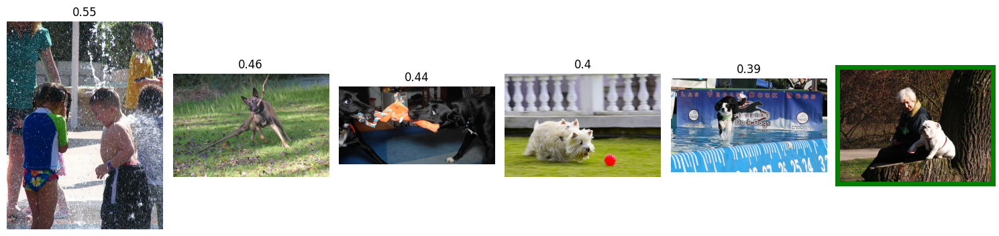

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


['381514859_b40418d9c3.jpg',
 '2709359730_13bca100af.jpg',
 '661749711_6f408dad62.jpg',
 '3488087117_2719647989.jpg',
 '2986716822_e220754d32.jpg']

[0.615520179271698,
 0.5781489014625549,
 0.5540241003036499,
 0.545394241809845,
 0.5316655039787292]


-------------------- a tan dog wearing a multicolored color running on the beach --------------------



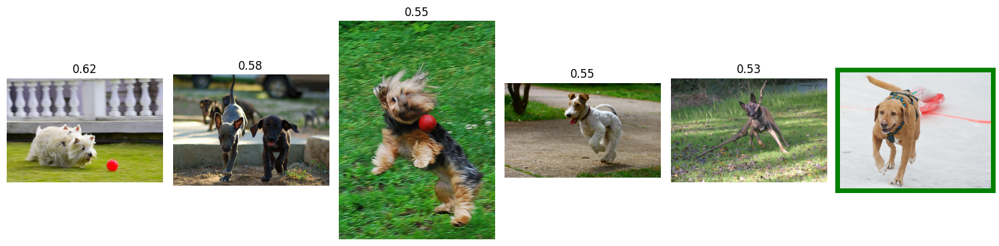


-------------------- A woman is throwing a bucket of water over a baby in the paddling pool . --------------------

This image is unavailable in your country in compliance with local laws.



  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


['3722572342_6904d11d52.jpg',
 '3730011701_5352e02286.jpg',
 '3142055158_01b9e4caa4.jpg',
 '2399551242_c62a46dd5f.jpg',
 '2714674623_8cd05ac114.jpg']

[0.4495147466659546,
 0.3306819796562195,
 0.32967936992645264,
 0.26317858695983887,
 0.23375989496707916]


-------------------- A man is videotaping something . --------------------



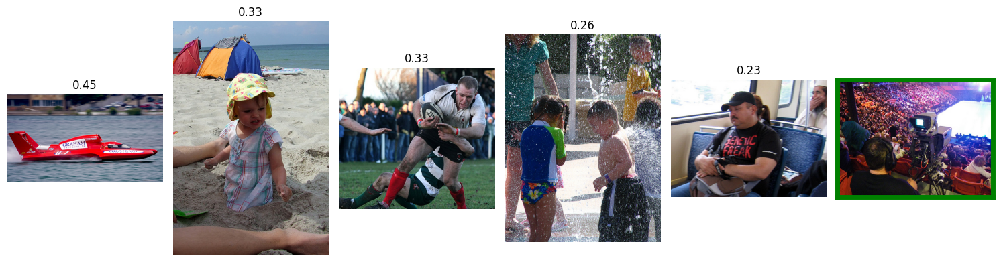

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


['661749711_6f408dad62.jpg',
 '381514859_b40418d9c3.jpg',
 '3488087117_2719647989.jpg',
 '2986716822_e220754d32.jpg',
 '3044359043_627488ddf0.jpg']

[0.6983699202537537,
 0.5790805816650391,
 0.5682895183563232,
 0.5434229373931885,
 0.5347867608070374]


-------------------- The furry black and white dog is running through a shallow pool . --------------------



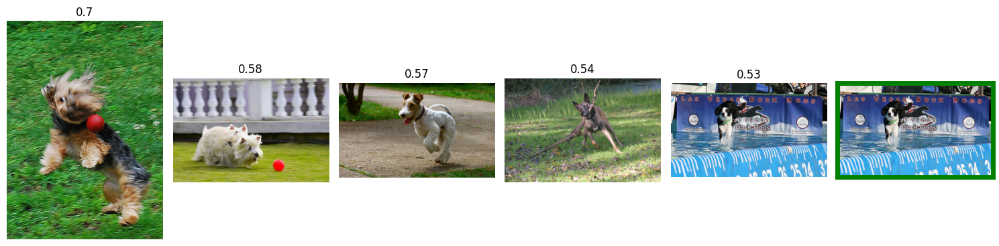

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


['3553476195_fb3747d7c1.jpg',
 '2986716822_e220754d32.jpg',
 '3044359043_627488ddf0.jpg',
 '2709359730_13bca100af.jpg',
 '381514859_b40418d9c3.jpg']

[0.7875147461891174,
 0.7102569937705994,
 0.668212890625,
 0.6584047079086304,
 0.6389341354370117]


-------------------- Two dogs are wrestling in a field . --------------------



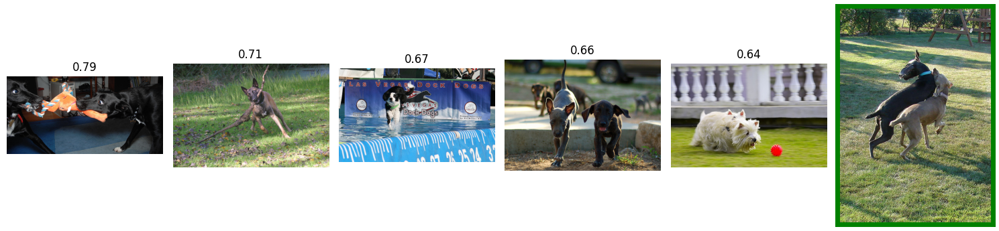


-------------------- a group of teenagers standing outside of a convienance store . --------------------

This image is unavailable in your country in compliance with local laws.



  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


['2428094795_d3a8f46046.jpg',
 '3356748019_2251399314.jpg',
 '3722572342_6904d11d52.jpg',
 '3517023411_a8fbd15230.jpg',
 '2885891981_6b02620ae9.jpg']

[0.5181475281715393,
 0.49671727418899536,
 0.4454152584075928,
 0.4336857199668884,
 0.43305468559265137]


-------------------- A man is operating a television camera high up in a crowded stadium . --------------------



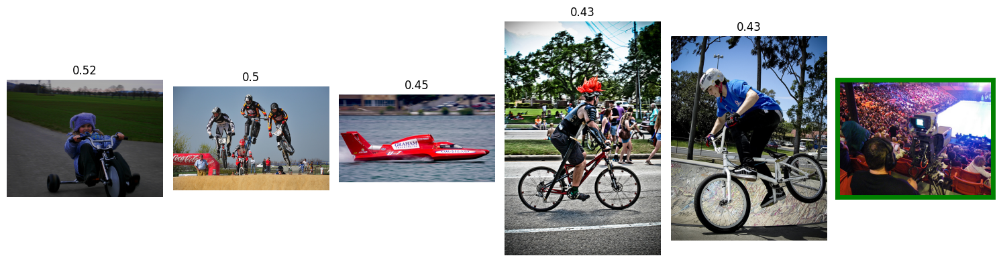

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


['2399551242_c62a46dd5f.jpg',
 '2517284816_9b8fd3c6b6.jpg',
 '3459871361_92d1ecda36.jpg',
 '3396275223_ee080df8b5.jpg',
 '1991806812_065f747689.jpg']

[0.6734416484832764,
 0.45998674631118774,
 0.427041232585907,
 0.4210035800933838,
 0.413038432598114]


-------------------- Two women jump in the grass atop a mountain . --------------------



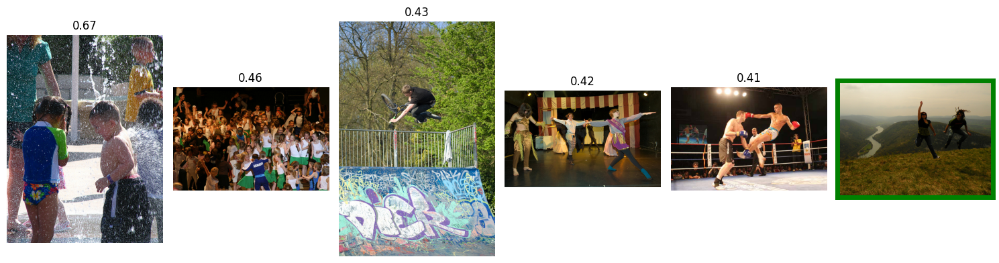

  0%|          | 0/1 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


['2399551242_c62a46dd5f.jpg',
 '3730011701_5352e02286.jpg',
 '3722572342_6904d11d52.jpg',
 '2737233999_34d60dc5c3.jpg',
 '2597308074_acacc12e1b.jpg']

[0.5698370337486267,
 0.3326569199562073,
 0.3148666024208069,
 0.2808835506439209,
 0.2684285640716553]


-------------------- An Arabic man in a white hat . --------------------



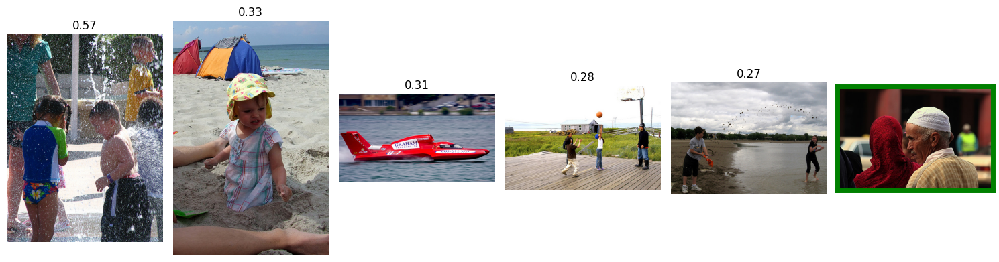

In [53]:
for text in text_test:
    get_picture(text)

В данной работе мы делали MVP для системы поиска изображений по фотографии.

В ходе работы для векторизации изображений мы использовали сеть ResNet50, а для текстовых эмбеддингов DistillBert.

После объединения признаков и выделения целей (экспертные оценки схожести описания и картинок), мы исследовали три модели для оценки схожести:

LinearRegression
CatBoost
несколько нейронных сетей
Лучше всего себя показала нейронная сеть с большим количеством нейронов и нормализацией батчей.

В конце работы мы написали функцию которая по тексту возвращает 5 наиболее похожих картинок и протестировали её на предложенном наборе тестовых картинок.

К сожалению выбранный подход не оправдал себя. Картинки вообще не похожи тематически.

В качестве возможных путей для решения можно предложить использовать полный набор картинок из датасета Flickr30k и смену архитектуры решения.

## 8. Выводы

- Jupyter Notebook открыт
- Весь код выполняется без ошибок
- Ячейки с кодом расположены в порядке исполнения
- Исследовательский анализ данных выполнен
- Проверены экспертные оценки и краудсорсинговые оценки
- Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- Изображения векторизованы
- Текстовые запросы векторизованы
- Данные корректно разбиты на тренировочную и тестовую выборки
- Предложена метрика качества работы модели
- Предложена модель схожести изображений и текстового запроса
- Модель обучена
- По итогам обучения модели сделаны выводы
- Проведено тестирование работы модели
- По итогам тестирования визуально сравнили качество поиска